In [1]:
import pandas as pd
import matplotlib.pyplot as plot
# Pour afficher le tableau entièrement
pd.set_option('display.max_columns', None) 
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None) 

# On récupère le fichier CSV et on drop les columns inutiles
file = pd.read_csv("./Big_Cities_Health_Data_Inventory.csv")
file = file.drop(['Notes', 'Methods', 'Source', 'BCHC Requested Methodology'], axis=1)

# On drop les lignes dont une valeur est nulle
file = file.dropna()

# Fonction pour drop les lignes dont les columns ont une certaine value : 
def filter_rows_by_values(df, col, values):
    return df[df[col].isin(values)]

# On affiche le tableau entièrement
file.head(len(file.index))

,Indicator Category,Indicator,Year,Gender,Race/ Ethnicity,Value,Place
0,HIV/AIDS,"AIDS Diagnoses Rate (Per 100,000 people)",2013,Both,All,30.4,"Atlanta (Fulton County), GA"
1,HIV/AIDS,"AIDS Diagnoses Rate (Per 100,000 people)",2012,Both,All,39.6,"Atlanta (Fulton County), GA"
2,HIV/AIDS,"AIDS Diagnoses Rate (Per 100,000 people)",2011,Both,All,41.7,"Atlanta (Fulton County), GA"
3,Cancer,"All Types of Cancer Mortality Rate (Age-Adjusted; Per 100,000 people)",2013,Male,All,195.8,"Atlanta (Fulton County), GA"
4,Cancer,"All Types of Cancer Mortality Rate (Age-Adjusted; Per 100,000 people)",2013,Female,All,135.5,"Atlanta (Fulton County), GA"
5,Cancer,"All Types of Cancer Mortality Rate (Age-Adjusted; Per 100,000 people)",2013,Both,All,159.3,"Atlanta (Fulton County), GA"
6,Cancer,"All Types of Cancer Mortality Rate (Age-Adjusted; Per 100,000 people)",2012,Male,All,199.2,"Atlanta (Fulton County), GA"
7,Cancer,"All Types of Cancer Mortality Rate (Age-Adjusted; Per 100,000 people)",2012,Female,All,137.6,"Atlanta (Fulton County), GA"
8,Cancer,"All Types of Cancer Mortality Rate (Age-Adjusted; Per 100,000 people)",2012,Both,All,160.3,"Atlanta (Fulton County), GA"
9,Cancer,"All Types of Cancer Mortality Rate (Age-Adjusted; Per 100,000 people)",2011,Male,All,196.2,"Atlanta (Fulton County), GA"


In [2]:
# On fait un groupby sur les Indicator Category pour comparer les values
fileValuesByCategory = file.groupby(["Indicator Category"]).Value.mean()
print(fileValuesByCategory)

Indicator Category
Behavioral Health/Substance Abuse            129.590603
Cancer                                        81.813059
Demographics                                5196.073054
Food Safety                                    9.513616
HIV/AIDS                                     241.743730
Infectious Disease                            22.440108
Injury and Violence                           10.085752
Life Expectancy and Death Rate (Overall)     511.684375
Maternal and Child Health                      8.570068
Nutrition, Physical Activity, & Obesity       68.440555
Tobacco                                       15.280698
Name: Value, dtype: float64


<AxesSubplot:xlabel='Indicator Category'>

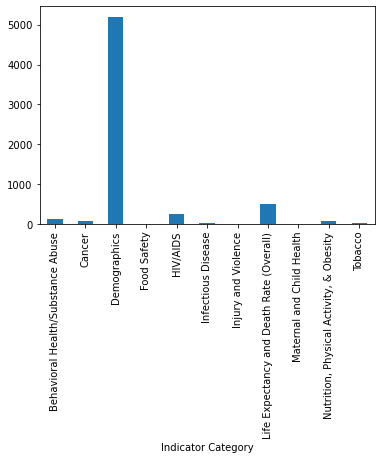

In [3]:
fileValuesByCategory.plot.bar()
# on se rend compte qu'on ne peut pas comparer les catégories entre elles car les valeurs ne correspondent
# pas à la même chose (Parfois un nombre de cas sur 100.000 habitants, parfois un pourcentage,
# parfois un nombre de cas, parfois une mortalité...) 

In [4]:
# Nous avons décidé d'étudier en détail le VIH et l'obésité en amérique, en comparants les données
# parmi les différentes villes, années, sexe et encore "races".

fileObesity = filter_rows_by_values(file, "Indicator Category", ["Nutrition, Physical Activity, & Obesity"])
fileObesity.head(50)

,Indicator Category,Indicator,Year,Gender,Race/ Ethnicity,Value,Place
34,"Nutrition, Physical Activity, & Obesity","Diabetes Mortality Rate (Age-Adjusted; Per 100,000 people)",2013,Both,All,19.3,"Atlanta (Fulton County), GA"
35,"Nutrition, Physical Activity, & Obesity","Diabetes Mortality Rate (Age-Adjusted; Per 100,000 people)",2013,Female,All,17.1,"Atlanta (Fulton County), GA"
36,"Nutrition, Physical Activity, & Obesity","Diabetes Mortality Rate (Age-Adjusted; Per 100,000 people)",2013,Male,All,22.1,"Atlanta (Fulton County), GA"
37,"Nutrition, Physical Activity, & Obesity","Diabetes Mortality Rate (Age-Adjusted; Per 100,000 people)",2011,Both,All,19.2,"Atlanta (Fulton County), GA"
38,"Nutrition, Physical Activity, & Obesity","Diabetes Mortality Rate (Age-Adjusted; Per 100,000 people)",2011,Female,All,17.5,"Atlanta (Fulton County), GA"
39,"Nutrition, Physical Activity, & Obesity","Diabetes Mortality Rate (Age-Adjusted; Per 100,000 people)",2011,Male,All,22.3,"Atlanta (Fulton County), GA"
40,"Nutrition, Physical Activity, & Obesity","Diabetes Mortality Rate (Age-Adjusted; Per 100,000 people)",2012,Both,All,16.5,"Atlanta (Fulton County), GA"
41,"Nutrition, Physical Activity, & Obesity","Diabetes Mortality Rate (Age-Adjusted; Per 100,000 people)",2012,Female,All,14.0,"Atlanta (Fulton County), GA"
42,"Nutrition, Physical Activity, & Obesity","Diabetes Mortality Rate (Age-Adjusted; Per 100,000 people)",2012,Male,All,20.8,"Atlanta (Fulton County), GA"
43,"Nutrition, Physical Activity, & Obesity","Diabetes Mortality Rate (Age-Adjusted; Per 100,000 people)",2013,Both,Black,36.5,"Atlanta (Fulton County), GA"


Place
Atlanta (Fulton County), GA         61.200000
Baltimore, MD                       56.683871
Boston, MA                          45.931250
Chicago, IL                         73.407292
Cleveland, OH                      198.496667
Denver, CO                          69.688000
Detroit, MI                         92.938235
Fort Worth (Tarrant County), TX     97.902326
Houston, TX                         85.793617
Kansas City, MO                     97.596970
Las Vegas (Clark County), NV        63.436905
Long Beach, CA                      88.853125
Los Angeles, CA                     39.756566
Miami (Miami-Dade County), FL       70.566316
Minneapolis, MN                     73.035556
New York, NY                        54.577358
Oakland, CA                         57.681481
Philadelphia, PA                    65.563636
Phoenix, AZ                         40.966667
Portland (Multnomah County), OR     78.868750
Sacramento, CA                     155.434091
San Antonio, TX             

<AxesSubplot:xlabel='Place'>

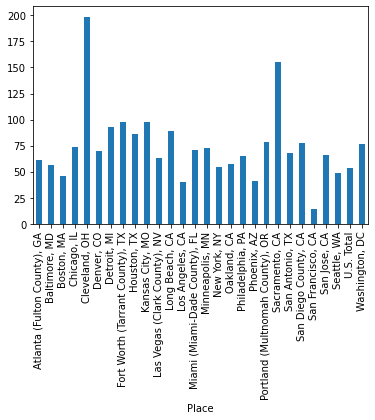

In [5]:
fileObesityPerPlace = fileObesity.groupby(["Place"]).Value.mean()
print(fileObesityPerPlace)
fileObesityPerPlace.plot.bar()

Gender
Both      67.464187
Female    58.046442
Male      83.660150
Name: Value, dtype: float64


<AxesSubplot:xlabel='Gender'>

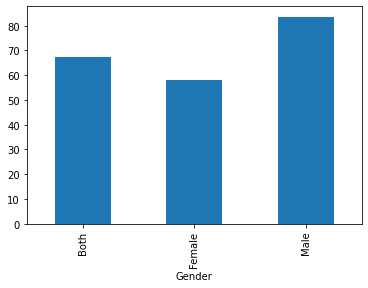

In [6]:
fileObesityPerGender = fileObesity.groupby(["Gender"]).Value.mean()
print(fileObesityPerGender)
fileObesityPerGender.plot.bar()

Year
2010         70.263559
2011         66.011130
2011-2012    37.900000
2012         83.382045
2013         57.135305
2014         81.775556
2015         29.150000
Name: Value, dtype: float64


<AxesSubplot:xlabel='Year'>

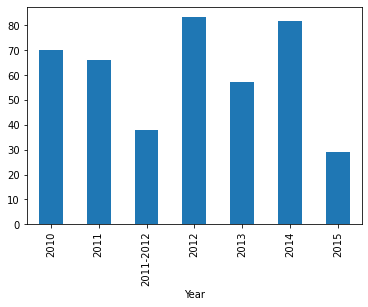

In [7]:
fileObesityPerYear = fileObesity.groupby(["Year"]).Value.mean()
print(fileObesityPerYear)
fileObesityPerYear.plot.bar()

Race/ Ethnicity
All                              69.842092
American Indian/Alaska Native     0.000000
Asian/PI                         46.538889
Black                            91.302692
Hispanic                         53.919742
Multiracial                      28.533333
Native American                  66.021212
Other                            56.105556
White                            73.179087
Name: Value, dtype: float64


<AxesSubplot:xlabel='Race/ Ethnicity'>

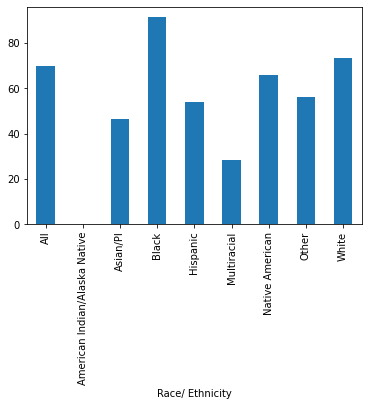

In [8]:
fileObesityPerRace = fileObesity.groupby(["Race/ Ethnicity"]).Value.mean()
print(fileObesityPerRace)
fileObesityPerRace.plot.bar()

In [14]:
# On cherche à comprendre pourquoi il y'a autant d'obésité à Cleveland.
fileDemographics = filter_rows_by_values(file, "Indicator Category", ["Demographics"])
fileDemographics.head(100)

,Indicator Category,Indicator,Year,Gender,Race/ Ethnicity,Value,Place
149,Demographics,Median Household Income (Dollars),2013,Both,All,46485.0,"Atlanta (Fulton County), GA"
150,Demographics,Median Household Income (Dollars),2012,Both,All,46466.0,"Atlanta (Fulton County), GA"
164,Demographics,Percent 18+ High School Graduates,2013,Both,All,89.3,"Atlanta (Fulton County), GA"
165,Demographics,Percent 18+ High School Graduates,2012,Both,All,89.0,"Atlanta (Fulton County), GA"
166,Demographics,Percent Below 200% Poverty Level,2013,Both,All,41.5,"Atlanta (Fulton County), GA"
167,Demographics,Percent Below 200% Poverty Level,2012,Both,All,45.3,"Atlanta (Fulton County), GA"
168,Demographics,Percent Foreign Born,2013,Both,All,7.8,"Atlanta (Fulton County), GA"
169,Demographics,Percent Foreign Born,2012,Both,All,8.1,"Atlanta (Fulton County), GA"
232,Demographics,Percent of Children Living in Poverty,2013,Both,All,40.0,"Atlanta (Fulton County), GA"
233,Demographics,Percent of Children Living in Poverty,2012,Both,All,40.3,"Atlanta (Fulton County), GA"


Place
Atlanta (Fulton County), GA        46475.500000
Baltimore, MD                      40753.500000
Boston, MA                         52612.500000
Chicago, IL                        46156.500000
Cleveland, OH                      25176.500000
Dallas, TX                         41666.000000
Denver, CO                         50788.500000
Detroit, MI                        24210.000000
Fort Worth (Tarrant County), TX    56853.000000
Houston, TX                        48891.500000
Kansas City, MO                    43714.000000
Las Vegas (Clark County), NV       52873.000000
Los Angeles, CA                    47634.500000
Miami (Miami-Dade County), FL      43100.000000
Minneapolis, MN                    49083.500000
New York, NY                       51559.000000
Oakland, CA                        51295.000000
Philadelphia, PA                   36111.000000
Phoenix, AZ                        45377.000000
Portland (Multnomah County), OR    52312.666667
Sacramento, CA                    

<AxesSubplot:xlabel='Place'>

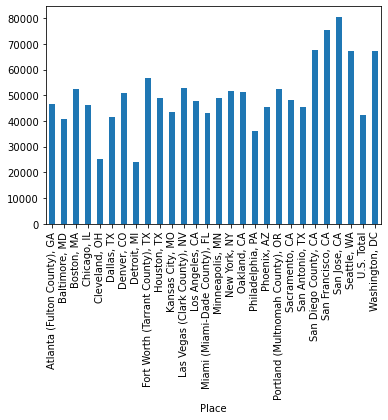

In [12]:
fileDemographicsIncome = filter_rows_by_values(file, "Indicator", ["Median Household Income (Dollars)"])
fileDemographicsPerPlace = fileDemographicsIncome.groupby(["Place"]).Value.mean()
print(fileDemographicsPerPlace)
fileDemographicsPerPlace.plot.bar()

Place
Atlanta (Fulton County), GA        43.400000
Baltimore, MD                      45.000000
Boston, MA                         38.200000
Chicago, IL                        44.650000
Cleveland, OH                      61.850000
Dallas, TX                         50.950000
Denver, CO                         38.450000
Detroit, MI                        64.650000
Fort Worth (Tarrant County), TX    41.250000
Houston, TX                        47.100000
Kansas City, MO                    40.600000
Las Vegas (Clark County), NV       39.800000
Los Angeles, CA                    46.600000
Miami (Miami-Dade County), FL      57.850000
Minneapolis, MN                    41.350000
New York, NY                       40.900000
Oakland, CA                        42.050000
Philadelphia, PA                   49.500000
Phoenix, AZ                        46.950000
Portland (Multnomah County), OR    36.333333
Sacramento, CA                     45.350000
San Antonio, TX                    43.850000
San 

<AxesSubplot:xlabel='Place'>

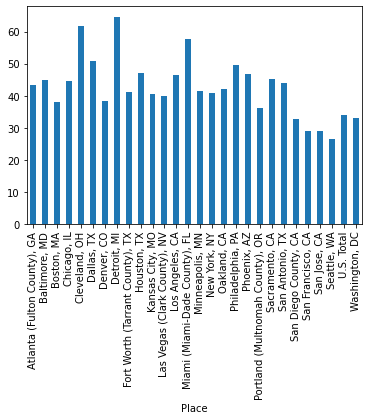

In [15]:
fileDemographicsPoverty = filter_rows_by_values(file, "Indicator", ["Percent Below 200% Poverty Level"])
fileDemographicsPovertyPerPlace = fileDemographicsPoverty.groupby(["Place"]).Value.mean()
print(fileDemographicsPovertyPerPlace)
fileDemographicsPovertyPerPlace.plot.bar()

# On s'aperçoit que la population de Cleveland a un revenu moyen très pauvre et vit largement en 
# dessous du seuil de pauvreté.
# Pourtant --> Detroit aussi et ils n'ont pas autant d'habitants en situation d'obésité.
# (Même s'ils sont tout de même 2x fois plus d'obésité que la moyenne aux USA)

Place
Atlanta (Fulton County), GA        40.150000
Baltimore, MD                      35.100000
Boston, MA                         28.950000
Chicago, IL                        34.150000
Cleveland, OH                      57.100000
Dallas, TX                         38.950000
Denver, CO                         29.800000
Detroit, MI                        61.000000
Fort Worth (Tarrant County), TX    22.100000
Houston, TX                        36.700000
Kansas City, MO                    31.300000
Las Vegas (Clark County), NV       22.000000
Los Angeles, CA                    34.400000
Miami (Miami-Dade County), FL      26.600000
Minneapolis, MN                    30.550000
New York, NY                       30.450000
Oakland, CA                        28.650000
Philadelphia, PA                   37.450000
Phoenix, AZ                        36.850000
Portland (Multnomah County), OR    24.266667
Sacramento, CA                     33.750000
San Antonio, TX                    32.100000
San 

<AxesSubplot:xlabel='Place'>

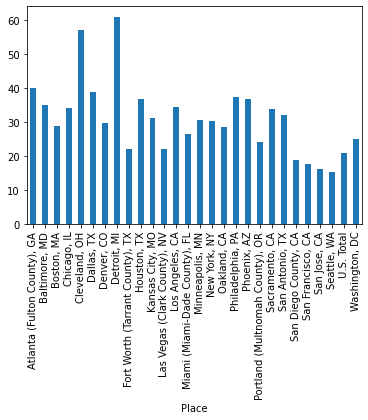

In [16]:
fileDemographicsChildPoverty = filter_rows_by_values(file, "Indicator", ["Percent of Children Living in Poverty"])
fileDemographicsChildPovertyPerPlace = fileDemographicsChildPoverty.groupby(["Place"]).Value.mean()
print(fileDemographicsChildPovertyPerPlace)
fileDemographicsChildPovertyPerPlace.plot.bar()

In [20]:
# Une deuxième cause de l'obésité que l'on peut étudier dans les données est 
# la dépression / l'alcoolisme / les drogues. On a décidé de ne pas étudier les drogues car les données sont 
# difficiles à définir selon le créateur du jeu de données.

fileBehavioral = filter_rows_by_values(file, "Indicator Category", ["Behavioral Health/Substance Abuse"])
fileBehavioral.head()

,Indicator Category,Indicator,Year,Gender,Race/ Ethnicity,Value,Place
51,Behavioral Health/Substance Abuse,"Drug Abuse-Related Hospitalization Rate (Per 100,000 people) *Comparisons of these data are difficult as definitions can vary.",2011,Both,All,60.9,"Atlanta (Fulton County), GA"
52,Behavioral Health/Substance Abuse,"Drug Abuse-Related Hospitalization Rate (Per 100,000 people) *Comparisons of these data are difficult as definitions can vary.",2013,Male,All,90.1,"Atlanta (Fulton County), GA"
53,Behavioral Health/Substance Abuse,"Drug Abuse-Related Hospitalization Rate (Per 100,000 people) *Comparisons of these data are difficult as definitions can vary.",2013,Female,All,36.6,"Atlanta (Fulton County), GA"
54,Behavioral Health/Substance Abuse,"Drug Abuse-Related Hospitalization Rate (Per 100,000 people) *Comparisons of these data are difficult as definitions can vary.",2013,Both,All,62.3,"Atlanta (Fulton County), GA"
55,Behavioral Health/Substance Abuse,"Drug Abuse-Related Hospitalization Rate (Per 100,000 people) *Comparisons of these data are difficult as definitions can vary.",2012,Male,All,96.4,"Atlanta (Fulton County), GA"


In [21]:
fileBehavioralAlcool = filter_rows_by_values(file, "Indicator", ["Percent of Adults Who Binge Drank"])
fileBehavioralAlcool.head()

,Indicator Category,Indicator,Year,Gender,Race/ Ethnicity,Value,Place
192,Behavioral Health/Substance Abuse,Percent of Adults Who Binge Drank,2013,Both,All,14.2,"Atlanta (Fulton County), GA"
193,Behavioral Health/Substance Abuse,Percent of Adults Who Binge Drank,2013,Male,All,18.6,"Atlanta (Fulton County), GA"
194,Behavioral Health/Substance Abuse,Percent of Adults Who Binge Drank,2013,Female,All,10.4,"Atlanta (Fulton County), GA"
195,Behavioral Health/Substance Abuse,Percent of Adults Who Binge Drank,2012,Male,All,29.2,"Atlanta (Fulton County), GA"
196,Behavioral Health/Substance Abuse,Percent of Adults Who Binge Drank,2012,Female,All,13.6,"Atlanta (Fulton County), GA"


Place
Atlanta (Fulton County), GA        18.600000
Baltimore, MD                      18.746667
Boston, MA                         23.476923
Chicago, IL                        29.633333
Denver, CO                         24.827778
Fort Worth (Tarrant County), TX    17.566667
Houston, TX                        16.716667
Las Vegas (Clark County), NV       14.961111
Long Beach, CA                     20.750000
Los Angeles, CA                    15.700000
Miami (Miami-Dade County), FL      13.858333
Minneapolis, MN                     7.650000
New York, NY                       18.675000
Philadelphia, PA                   20.644444
Phoenix, AZ                        17.370000
San Antonio, TX                    35.300000
San Diego County, CA               34.362500
San Jose, CA                       54.000000
Seattle, WA                        16.846154
U.S. Total                         25.812000
Washington, DC                     23.665000
Name: Value, dtype: float64


<AxesSubplot:xlabel='Place'>

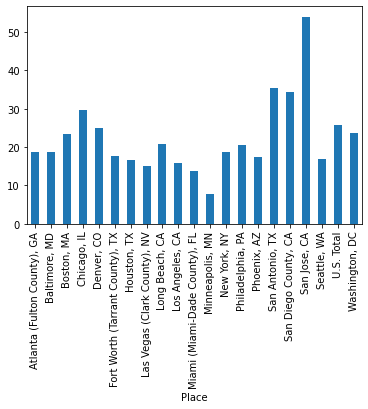

In [22]:
fileBehavioralAlcoolPerPlace = fileBehavioralAlcool.groupby(["Place"]).Value.mean()
print(fileBehavioralAlcoolPerPlace)
fileBehavioralAlcoolPerPlace.plot.bar()
# On se rend compte que Cleveland n'a pas de data.